# This notebook calculates MOD for a specified area and all complete years for a given sensor.

## Spatial data from rSIR and GRD are displayed using cartopy, with elevation data.


## Load in all the modules needed

No longer requires Basemap, now using cartopy for projection information, and shapely for basin outlines.

In [1]:
%pylab notebook
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import shapely.geometry as sgeom
import matplotlib.pyplot as plt
from netCDF4 import Dataset, num2date
import numpy as np
import pandas as pd
from cetbtools.ease2conv import Ease2Transform
from mpl_toolkits.basemap import Basemap
import time

Populating the interactive namespace from numpy and matplotlib


In [2]:
# navigate to where scripts are saved
%cd /projects/brodzik/ipynb_melt_onset/scripts/
%ls

/projects/brodzik/ipynb_melt_onset/scripts
CETB_algorithms.py  CETB_analysis.py~       __pycache__/
CETB_analysis.py    CETB_read_functions.py


In [3]:
# load the custom functions
from CETB_read_functions import read_Tb
from CETB_read_functions import coords
from CETB_read_functions import calc_DAV
from CETB_read_functions import find_UIB_cube_offset
from CETB_read_functions import grid_locations_of_UIB
from CETB_algorithms import DAV_MOD
from CETB_analysis import MOD_array
from CETB_analysis import MOD_array_year

## Specify inputs

In [4]:
#Specify region, satellite, sensor, channel, and image reconstruction algorithm of interest in file name
# this notebook will read in 2 CETB datasets so that channels/algorithms/sensors can be compared
region='UIB'  #make this the same syntax as cubefilenames and sub-directory
platform='AQUA'   #'AQUA' for AMSRE, 'F13','F14','F15'... for SSMI
sensor='AMSRE'  #'AMSRE', 'SSMI', etc.
channel='36V'  #'36V','36H', '18V','18H', etc. '19V','19H' and '37V','37H' for SSMI)
version='v1.3'
proj='N'

if sensor=='SSMI':
    provider='CSU' 
elif sensor=='AMSRE':
    provider='RSS'

cubeDir = '/work/PMESDR/CETB_v1.3/%s_%s/%s/cubes_%s/' % (platform, sensor, proj, region)    

# prefix filepath
prefix_GRD = 'CETB.cubefile.%s.%s_%s-%s-GRD-%s-%s' % (region, platform, sensor, channel, provider, version)
prefix_SIR = 'CETB.cubefile.%s.%s_%s-%s-SIR-%s-%s' % (region, platform, sensor, channel, provider, version)

# years for each sensor
# F13, May 95 - Nov 09
if platform=='F13':
    # F13, May 95 - Nov 09
    Years = [2002,2003,2004,2005,2006,2007,2008,2009]
elif platform=='F14':
    # F14, May 97 - Aug 08
    Years=[2002,2003,2004,2005,2006,2007,2008]
elif platform=='F15':
    # F15, Feb 00 - Jun 17
    Years=[2002,2003,2004,2005,2006,2007,2008,2009,2010,2011]
elif platform=='AQUA':
    # AQUA AMSR-E: Jun 02 - Oct 11
    Years=[2003,2004,2005,2006,2007,2008,2009,2010,2011]

#Enter a site name for titles of plots
Site='Hunza'

In [5]:
# SPECIFY latitude and longitude in decimal degrees, need to choose lat/lon corners so that we will load
# in a rectangle of pixels within the corners of these coordinates
lat_start=35.9
lat_end=37.1
lon_start=74
lon_end=76

In [6]:
# get cube offset for finding row/col
# function is region specific
find_UIB_cube_offset(cubeDir, cubeType=None, verbose=True)

EASE2_N3.125km offsets for cubeType=36V-SIR
(Add these offsets to cube (row, col) to get row, col in full hemisphere)
offset row = 3120.000000, offset col = 4608.000000


(3120.000000031471, 4608.00000022618)

In [7]:
# get the GRD pixel IDs for the lat/lon rectangle chosen
rows_cols_GRD=coords(cubeDir, prefix_GRD, lat_start, lat_end, lon_start, lon_end)
rows_cols_GRD

(25, 33, 3, 8)

In [8]:
# row and col numbers of all the SIR pixels contained by the GRD pixels
# FIXME: this assumes SIR is 3.125 km data
rows_cols_env=[rows_cols_GRD[0]*8,rows_cols_GRD[1]*8, rows_cols_GRD[2]*8, rows_cols_GRD[3]*8]
rows_cols_env

[200, 264, 24, 64]

In [9]:
# load in SIR TB data
data_SIR=read_Tb(cubeDir, prefix_SIR, Years,rows_cols_env[0],rows_cols_env[1],rows_cols_env[2],rows_cols_env[3])
CETB_SIR=data_SIR['TB']   # 3-D Tb time-series array of TB
cal_date=data_SIR['cal_date']    # 1-D array of dates, these will get passed to later functions
cal_year=data_SIR['cal_year']    # 1-D array of years
cal_month=data_SIR['cal_month']   # 1-D array of months

# load GRD Tb data
data_GRD=read_Tb(cubeDir, prefix_GRD, Years,rows_cols_GRD[0],rows_cols_GRD[1],rows_cols_GRD[2],rows_cols_GRD[3])
CETB_GRD=data_GRD['TB']

In [10]:
# calculate DAV for the Tb data that was imported
DAV_SIR=calc_DAV(CETB_SIR)
DAV_GRD=calc_DAV(CETB_GRD)

## get the latitudes and longitudes of each pixel for plotting

In [92]:
#Get lat/lon of each pixel in the subset of 64
# these get used for plotting over basemap
filename="%s%s.%4d.TB.nc" % (cubeDir, prefix_SIR, 2003)
data=Dataset(filename, "r", format="NETCDF4")

lat=data.variables['latitude'] 
lat=lat[:]
lon=data.variables['longitude']
lon=lon[:]
lat_lon=np.dstack((lat,lon))

coordinates=lat_lon[rows_cols_env[0]:rows_cols_env[1],rows_cols_env[2]:rows_cols_env[3]]

coordinates=coordinates.reshape(((rows_cols_env[1]-rows_cols_env[0])*(rows_cols_env[3]-rows_cols_env[2])),2)
pixel_lats=coordinates[:,0]
pixel_lons=coordinates[:,1]

pixel_lats

array([37.51086985, 37.48042702, 37.44997903, ..., 35.87361555,
       35.84317362, 35.81272617])

In [93]:
#Get lat/lon for GRD pixels
# similar to SIR above
filename="%s%s.%4d.TB.nc" % (cubeDir, prefix_GRD, 2003)
data=Dataset(filename, "r", format="NETCDF4")

lat=data.variables['latitude'] 
lat=lat[:]
lon=data.variables['longitude']
lon=lon[:]
lat_lon=np.dstack((lat,lon))

coordinates=lat_lon[rows_cols_GRD[0]:rows_cols_GRD[1],rows_cols_GRD[2]:rows_cols_GRD[3]]

coordinates=coordinates.reshape(((rows_cols_GRD[1]-rows_cols_GRD[0])*(rows_cols_GRD[3]-rows_cols_GRD[2])),2)
pixel_lats_GRD=coordinates[:,0]
pixel_lons_GRD=coordinates[:,1]

pixel_lats_GRD

array([37.37745373, 37.13370658, 36.8896261 , 36.64521097, 36.40045984,
       37.31533536, 37.07178516, 36.82789953, 36.58367717, 36.33911674,
       37.2521595 , 37.008809  , 36.76512093, 36.52109401, 36.27672694,
       37.18792871, 36.94478059, 36.70129274, 36.45746392, 36.21329284,
       37.12264554, 36.87970245, 36.63641747, 36.39278935, 36.14881684,
       37.05631258, 36.81357715, 36.57049763, 36.32707279, 36.08330139,
       36.98893244, 36.74640726, 36.50353575, 36.26031672, 36.01674895,
       36.92050778, 36.67819538, 36.43553441, 36.19252369, 35.94916202])

In [11]:
# Given a cube's x, y values
# calculate the extent of the edges 
# as 1/2 pixel larger than centers of corner pixels
def get_extent_xy(x, y):
    # Assumes pixels with regular spacing
    scale_x = x[1] - x[0]
    scale_y = y[1] - y[0]
    print("scales: ", scale_x, scale_y)
    
    extent = [x[0] - (scale_x/2.),
              x[-1] + (scale_x/2.),
              y[-1] + (scale_y/2.),
              y[0] - (scale_y/2.)]
              
    return extent

## Check extents of full cube

In [12]:
get_extent_xy(data_SIR['x'], data_SIR['y'])

scales:  3125.0 -3125.0


[5400000.0, 6275000.0, -1875000.0, -750000.0]

In [13]:
get_extent_xy(data_GRD['x'], data_GRD['y'])

scales:  25000.0 -25000.0


[5400000.0, 6275000.0, -1875000.0, -750000.0]

## Check extents of requested subsets

In [36]:
get_extent_xy(data_SIR['x'][rows_cols_env[2]:rows_cols_env[3]],
              data_SIR['y'][rows_cols_env[0]:rows_cols_env[1]])

scales:  3125.0 -3125.0


[5475000.0, 5600000.0, -1575000.0, -1375000.0]

In [37]:
get_extent_xy(data_GRD['x'][rows_cols_GRD[2]:rows_cols_GRD[3]],
              data_GRD['y'][rows_cols_GRD[0]:rows_cols_GRD[1]])

scales:  25000.0 -25000.0


[5475000.0, 5600000.0, -1575000.0, -1375000.0]

## create arrays of MOD to be used for plotting

In [14]:
# get array of average MODs for SIR pixels for all the years loaded
window=10   # window for MOD algorithm, '10' would be 5 days (2 measurements per day)
count=3    # number of Tb/DAV exceedances to trigger MOD
DAV_threshold=40
Tb_threshold=252
year=2003

In [15]:
Years

[2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011]

In [16]:
# sir MOD array - MOD will be in day of year (DOY)
t = time.process_time()
MOD_DOY_array=MOD_array(cubeDir, prefix_SIR, CETB_SIR, DAV_SIR, 
                        rows_cols_env, cal_date, Years, window, count, DAV_threshold, Tb_threshold)
elapsed_time = time.process_time() - t
MOD_DOY_array, elapsed_time

MOD by pixel and year:
       2003   2004   2005   2006   2007   2008   2009   2010   2011
0      99.0   38.0   56.0   66.0  103.0   65.0    NaN   70.0  105.0
1      83.0   29.0   15.0   37.0   87.0   69.0    NaN    4.0  105.0
2     131.0   29.0   17.0   27.0  103.0   65.0    NaN    6.0  103.0
3       NaN    NaN  111.0   37.0    NaN  122.0    NaN    6.0    NaN
4       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
5       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
6       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
7       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
8       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
9       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
10      NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
11      NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
12      NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
13      NaN    NaN    NaN

masked_array(data=[75.25, 53.625, 60.125, ..., nan, nan, 119.6],
             mask=[False, False, False, ..., False, False, False],
       fill_value=1e+20)

In [17]:
# get array of MOD for each pixel SIR - one year of interest
#window=10
#count=3
#DAV_threshold=18
#Tb_threshold=252
#year=2003

t = time.process_time()
MOD_DOY_array_year=MOD_array_year(cubeDir, prefix_SIR, CETB_SIR, DAV_SIR, 
                                  rows_cols_env, cal_date, year, window, count, DAV_threshold, Tb_threshold)
elapsed_time = time.process_time() - t
MOD_DOY_array_year, elapsed_time

(masked_array(data=[99.0, 83.0, 131.0, ..., nan, nan, nan],
              mask=[False, False, False, ..., False, False, False],
        fill_value=1e+20), 3.720344190000006)

In [18]:
# MOD of the GRD pixel - avg all years
#window=10
#count=3
#DAV_threshold=18
#Tb_threshold=252
t = time.process_time()
MOD_DOY_array_GRD=MOD_array(cubeDir, prefix_GRD, CETB_GRD, DAV_GRD, 
                            rows_cols_GRD, cal_date, Years, window, count, DAV_threshold, Tb_threshold)
elapsed_time = time.process_time() - t
MOD_DOY_array_GRD, elapsed_time

MOD by pixel and year:
     2003   2004   2005   2006   2007   2008   2009   2010   2011
0     NaN    NaN  111.0  116.0    NaN    NaN    NaN    NaN    NaN
1     NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
2     NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
3     NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
4     NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN
5     NaN   97.0  108.0  111.0    NaN    NaN    NaN    NaN  117.0
6   131.0   95.0  105.0  112.0  103.0  122.0    NaN   79.0  115.0
7   131.0   95.0  113.0  114.0  103.0  122.0  124.0  118.0  115.0
8   142.0  135.0  113.0  116.0  104.0  124.0  142.0  119.0  116.0
9   145.0  136.0  123.0  119.0  120.0    NaN  145.0  170.0  167.0
10    NaN    NaN    NaN  114.0    NaN    NaN    NaN    NaN    NaN
11  140.0   96.0  113.0  112.0  104.0  132.0    NaN  118.0  116.0
12  142.0  134.0  113.0  114.0  104.0  123.0  136.0  118.0  116.0
13  131.0   93.0  111.0  114.0  103.0  122.0  133.0  

(masked_array(data=[113.5, nan, nan, nan, nan, 108.25, 107.75, 115.0,
                    123.44444444444444, 140.625, 114.0, 116.375,
                    122.22222222222223, 115.55555555555556, 131.75,
                    112.77777777777777, 114.22222222222223,
                    118.88888888888889, 150.0, 196.66666666666666,
                    113.77777777777777, 109.77777777777777, 126.0, nan,
                    147.66666666666666, 120.33333333333333, 120.5, nan,
                    nan, nan, 117.66666666666667, 120.66666666666667,
                    130.83333333333334, nan, 137.0, 118.44444444444444,
                    130.88888888888889, 124.88888888888889, nan, nan],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
         

In [19]:
# get MOD for GRD pixel - one year of interest
#window=10
#count=3
#DAV_threshold=18
#Tb_threshold=252
#year=2003

t = time.process_time()

MOD_DOY_array_GRD_year=MOD_array_year(cubeDir, prefix_GRD, CETB_GRD, DAV_GRD, 
                                      rows_cols_GRD, cal_date, year, window, count, DAV_threshold, Tb_threshold)
elapsed_time = time.process_time() - t
MOD_DOY_array_GRD_year, elapsed_time

(masked_array(data=[nan, nan, nan, nan, nan, nan, 131.0, 131.0, 142.0,
                    145.0, nan, 140.0, 142.0, 131.0, 140.0, 136.0, 138.0,
                    140.0, 152.0, 182.0, 129.0, 129.0, 152.0, nan, 154.0,
                    140.0, 138.0, nan, nan, nan, 129.0, 129.0, 140.0, nan,
                    nan, 127.0, 140.0, 131.0, nan, nan],
              mask=[False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False,
                    False, False, False, False, False, False, False, False],
        fill_value=1e+20), 0.322840240000005)

# Save the original data as produced by Mitch's version

In [ ]:
# Save these arrays to numpy zip
outfile = '/projects/brodzik/pmesdr_melt_onset/data/Hunza_MOD.npz'
#np.savez(outfile, 
#         MOD_DOY_array=MOD_DOY_array, 
#         MOD_DOY_array_year=MOD_DOY_array_year, 
#         MOD_DOY_array_GRD=MOD_DOY_array_GRD, 
#         MOD_DOY_array_GRD_year=MOD_DOY_array_GRD_year)
npzfile = np.load(outfile)
npzfile.files
# should return 4 variable names as a dict
orig_MOD_DOY_array = npzfile['MOD_DOY_array']
orig_MOD_DOY_array_year = npzfile['MOD_DOY_array_year']
orig_MOD_DOY_array_GRD = npzfile['MOD_DOY_array_GRD']
orig_MOD_DOY_array_GRD_year = npzfile['MOD_DOY_array_GRD_year']


# Save the new data after my mods to make things fast 
# and removing the date shift of one day

In [ ]:
# Save these arrays to numpy zip
outfile = '/projects/brodzik/pmesdr_melt_onset/data/Hunza_MOD.fast_no_date_shift.npz'
np.savez(outfile, 
         MOD_DOY_array=MOD_DOY_array, 
         MOD_DOY_array_year=MOD_DOY_array_year, 
         MOD_DOY_array_GRD=MOD_DOY_array_GRD, 
         MOD_DOY_array_GRD_year=MOD_DOY_array_GRD_year)
#npzfile = np.load(outfile)
#npzfile.files
# should return 4 variable names as a dict
#MOD_DOY_array = npzfile['MOD_DOY_array']
#MOD_DOY_array_year = npzfile['MOD_DOY_array_year']
#MOD_DOY_array_GRD = npzfile['MOD_DOY_array_GRD']
#MOD_DOY_array_GRD_year = npzfile['MOD_DOY_array_GRD_year']


## Compare original data from Mitch to new data after my changes

In [ ]:
orig_MOD_DOY_array, MOD_DOY_array

In [ ]:
diff = MOD_DOY_array - orig_MOD_DOY_array
print(np.nanmin(diff), np.nanmax(diff))

In [ ]:
orig_MOD_DOY_array_year, MOD_DOY_array_year

In [ ]:
diff = MOD_DOY_array_year - orig_MOD_DOY_array_year
print(np.nanmin(diff), np.nanmax(diff))

In [ ]:
orig_MOD_DOY_array_GRD, MOD_DOY_array_GRD

In [ ]:
diff = MOD_DOY_array_GRD - orig_MOD_DOY_array_GRD
print(np.nanmin(diff), np.nanmax(diff))

In [ ]:
orig_MOD_DOY_array_GRD_year, MOD_DOY_array_GRD_year

In [ ]:
diff = MOD_DOY_array_GRD_year - orig_MOD_DOY_array_GRD_year
print(np.nanmin(diff), np.nanmax(diff))

# Convert the MOD information back to an image for display

In [21]:
MOD_DOY = MOD_DOY_array.reshape((rows_cols_env[1] - rows_cols_env[0],
                                 rows_cols_env[3] - rows_cols_env[2]))
MOD_DOY_year = MOD_DOY_array_year.reshape((rows_cols_env[1] - rows_cols_env[0],
                                           rows_cols_env[3] - rows_cols_env[2]))
                                         
MOD_DOY_GRD = MOD_DOY_array_GRD.reshape((rows_cols_GRD[1] - rows_cols_GRD[0],
                                         rows_cols_GRD[3] - rows_cols_GRD[2]))
MOD_DOY_GRD_year = MOD_DOY_array_GRD_year.reshape((rows_cols_GRD[1] - rows_cols_GRD[0],
                                                   rows_cols_GRD[3] - rows_cols_GRD[2]))

In [22]:
MOD_DOY_year.shape, MOD_DOY_GRD_year.shape

((64, 40), (8, 5))

## Slice the subset data back into the complete cube area

In [24]:
# Use cartopy for geolocated maps and Hunza shapefile overlay
# Do a quick sanity check check the UL corner of EASE-Grid 2.0 N should be:
# Answer should be lon=-135. lat=-84.634050
geod = ccrs.Geodetic()
e2n = ccrs.LambertAzimuthalEqualArea(central_latitude=90.0)
lon, lat = geod.transform_point(
    x = -9000000.,
    y = 9000000.,
    src_crs=e2n)
print(lon, lat)

-135.0 -84.6340496694687


In [25]:
# For UIB cubes, I want to rotate 90 degrees clockwise
e2nRotate = ccrs.LambertAzimuthalEqualArea(central_latitude=90.0, central_longitude=90.0)

## Read the basin outline shapefiles

Use shapely to read the .shp files.  This works for lonlat shapefiles, 
it doesn't seem to work for projected ones, there must be an option that I'm just missing.

Use the cartopy CRS to project the shapefile to E2N


In [26]:
hunzaBasinfile = '/work/charis/ti_model/basins/basin_outlines/IN_Hunza_at_DainyorBridge.shp'
hunzaReader = shpreader.Reader(hunzaBasinfile)
hunzaRecord = next(hunzaReader.records())
hunzaRecord, hunzaRecord.attributes, hunzaRecord.bounds, hunzaRecord.geometry

(<Record: <shapely.geometry.multipolygon.MultiPolygon object at 0x2af397c1cc18>, {'GRDC_NO': 2335100, 'WMO_REG': 2, 'SUB_REG': 35, 'MIX_REG': 235, 'NAT_ID': '1001', 'RIVER': 'HUNZA RIVER', 'STATION': 'DANYOUR BRIDGE', 'COUNTRY_CO': 'PK', 'LAT_ORG': 35.92, 'LONG_ORG': 74.38, 'LAT_NEW': 35.9271, 'LONG_NEW': 74.3729, 'DIST_KM': 1.0, 'AREA': 12950.0, 'AREA_HYS': 13746.4, 'AREA_DIFF': 6.1, 'ALTITUDE': -999.0, 'ELEV_HYS': 1446, 'DS_STAT_NO': 2335200, 'W_LEVEL': 0, 'D_START': 1978, 'D_END': 1982, 'D_YRS': 5, 'D_MISS': 20, 'M_START': 1978, 'M_END': 1982, 'M_YRS': 5, 'M_MISS': 20, 'T_START': 1978, 'T_END': 1982, 'T_YRS': 5, 'LTA_DISCHA': 381.128, 'DISC_HYS': 55.74, 'DISC_DIFF': -85.4, 'R_VOLUME_Y': 12, 'R_HEIGHT_Y': 928, 'PROC_TYRS': 80, 'PROC_TMON': 100, 'F_IMPORT': '16.1.1992', 'F_IM_YR': 1992, 'L_IMPORT': '10.5.1996', 'L_IM_YR': 1996, 'PROVIDER_I': -999, 'ACSYS': 0, 'FLUX2OCEAN': 0, 'GEMS': 0, 'GCOS_GTN_H': 0, 'STATISTICS': 0, 'CODE': 2, 'QUALITY': 'Medium', 'TYPE': 'Automatic', 'COMMENT': '

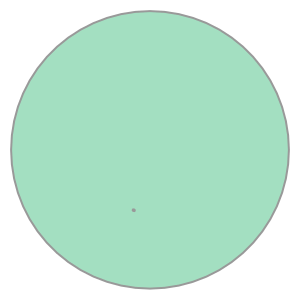

In [27]:
e2nRotateHunzaBasin = e2nRotate.project_geometry(hunzaRecord.geometry)
e2nRotateHunzaBasin

In [28]:
UIBBasinfile = '/work/charis/ti_model/basins/basin_outlines/UIB_Khan/UIB_shape_file/Upstream_Tarbela_lonlat.shp'
UIBReader = shpreader.Reader(UIBBasinfile)
UIBRecord = next(UIBReader.records())
UIBRecord, UIBRecord.attributes, UIBRecord.bounds, UIBRecord.geometry

(<Record: <shapely.geometry.multipolygon.MultiPolygon object at 0x2af3927a9fd0>, {'OBJECTID': 0, 'Shape_Leng': 0.0, 'Shape_Area': 172173.496284, 'HydroID': -281, 'Name': 'Tarbela Dam*'}, <fields>>,
 {'OBJECTID': 0,
  'Shape_Leng': 0.0,
  'Shape_Area': 172173.496284,
  'HydroID': -281,
  'Name': 'Tarbela Dam*'},
 (72.20510869192658,
  31.101009176780153,
  81.82542454706251,
  37.089310863423584),
 <shapely.geometry.multipolygon.MultiPolygon at 0x2af3927a9fd0>)

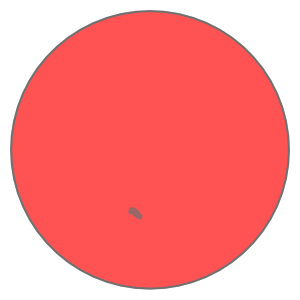

In [29]:
e2nRotateUIBBasin = e2nRotate.project_geometry(UIBRecord.geometry)
e2nRotateUIBBasin

In [32]:
data_SIR['x'].shape, data_SIR['y'].shape

((280,), (360,))

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(10,6))

label = "SIR Avg MOD (%4d-%4d)" % (Years[0], Years[-1])
im0 = ax[0,0].imshow(np.rot90(MOD_DOY, -1), cmap='RdBu', 
                    interpolation='None', vmin=np.min(75), vmax=np.max(170), label=label)
cbar0 = fig.colorbar(im0, ax=ax[0,0])
cbar0.ax.set_ylabel('DOY')
ax[0,0].axis('off')
ax[0,0].set_title(label)

label = "SIR MOD (%s)" % year
im1 = ax[0,1].imshow(np.rot90(MOD_DOY_year, -1), cmap='RdBu', 
                    interpolation='None', vmin=np.min(75), vmax=np.max(170), label=label)
fig.colorbar(im1, ax=ax[0,1])
ax[0,1].axis('off')
ax[0,1].set_title(label)

label = "GRD Avg MOD (%4d-%4d)" % (Years[0], Years[-1])
im2 = ax[1,0].imshow(np.rot90(MOD_DOY_GRD, -1), cmap='RdBu', 
                    interpolation='None', vmin=np.min(75), vmax=np.max(170), label=label)
fig.colorbar(im2, ax=ax[1,0])
ax[1,0].axis('off')
ax[1,0].set_title(label)

label = "GRD MOD (%s)" % year
im3 = ax[1,1].imshow(np.rot90(MOD_DOY_GRD_year, -1), cmap='RdBu', 
                    interpolation='None', vmin=np.min(75), vmax=np.max(170), label=label)
fig.colorbar(im3, ax=ax[1,1])
ax[1,1].axis('off')
ax[1,1].set_title(label)

plt.tight_layout()
#fig.savefig("./test.SIR-avg-std-min-max.t%03d.png" % (bandnum-1), dpi=300)

<IPython.core.display.Javascript object>


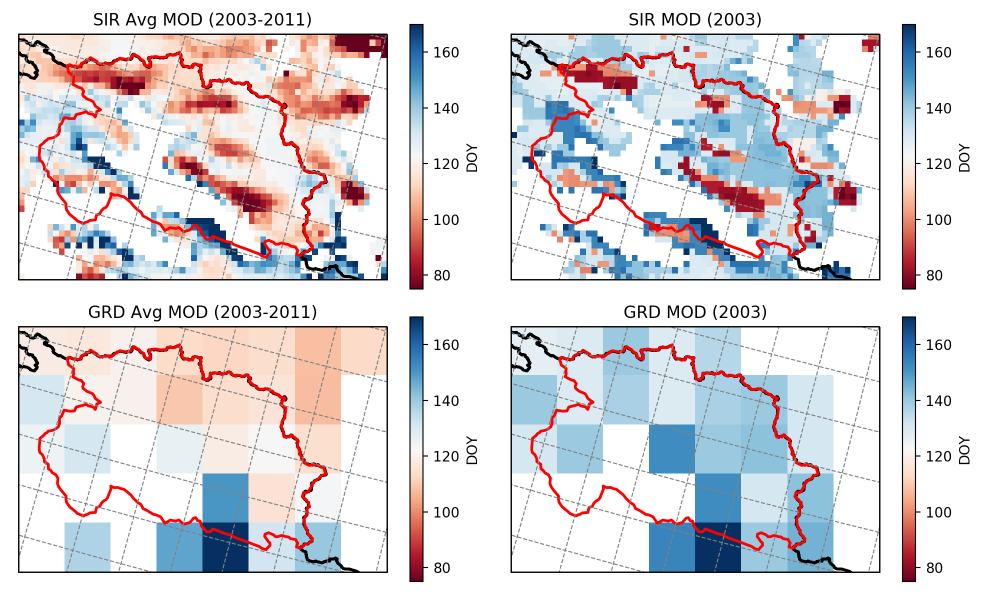

scales:  25000.0 -25000.0


In [91]:
fig = plt.figure(figsize=(10,6))

# Figure out the extent to display and rotate the extent by 90 degrees
# This extent is for the Hunza subset of the UIB cube,
# make sure to include one extra 25 km row/column on the bottom/right side
cube_extent=get_extent_xy(data_GRD['x'][rows_cols_GRD[2]:rows_cols_GRD[3]+1], 
                          data_GRD['y'][rows_cols_GRD[0]:rows_cols_GRD[1]+1])
cube_extentRotate=[cube_extent[2], cube_extent[3], -1.*cube_extent[1], -1. * cube_extent[0]]

# Placeholders for the various elements of each subplot
axes = []
images = []

numrows = 2
numcols = 2
numplots = 4

labels = ["SIR Avg MOD (%4d-%4d)" % (Years[0], Years[-1]),
          "SIR MOD (%s)" % year,
          "GRD Avg MOD (%4d-%4d)" % (Years[0], Years[-1]),
          "GRD MOD (%s)" % year]

# Set the projection and extent for each subplot
for i in np.arange(numplots):
    axes.append(fig.add_subplot(numrows, numcols, i+1, projection=e2nRotate))
    axes[i].set_extent(cube_extentRotate, crs=e2nRotate)

images.append(axes[0].imshow(np.rot90(MOD_DOY, -1), 
              extent=cube_extentRotate, 
              transform=e2nRotate,
              origin='upper', cmap='RdBu', 
              interpolation='None', vmin=np.min(75), vmax=np.max(170), label=labels[0]))

images.append(axes[1].imshow(np.rot90(MOD_DOY_year, -1), 
              extent=cube_extentRotate, 
              transform=e2nRotate,
              origin='upper', cmap='RdBu', 
              interpolation='None', vmin=np.min(75), vmax=np.max(170), label=labels[1]))

images.append(axes[2].imshow(np.rot90(MOD_DOY_GRD, -1), 
              extent=cube_extentRotate, 
              transform=e2nRotate,
              origin='upper', cmap='RdBu', 
              interpolation='None', vmin=np.min(75), vmax=np.max(170), label=labels[0]))

images.append(axes[3].imshow(np.rot90(MOD_DOY_GRD_year, -1), 
              extent=cube_extentRotate, 
              transform=e2nRotate,
              origin='upper', cmap='RdBu', 
              interpolation='None', vmin=np.min(75), vmax=np.max(170), label=labels[1]))

# Do common display stuff for each subplot
for i in np.arange(numplots):
    axes[i].axis('off')
    axes[i].gridlines(color='gray', linestyle='--')
    axes[i].coastlines()
    axes[i].add_geometries([e2nRotateUIBBasin], 
                      e2nRotate,
                      edgecolors='black', facecolor='none', lw=2)
    axes[i].add_geometries([e2nRotateHunzaBasin], e2nRotate,
                      edgecolors='red', facecolor='none', lw=2)
    #For separate colorbars:
    cbar = fig.colorbar(images[i], ax=axes[i])
    cbar.ax.set_ylabel('DOY')
    axes[i].set_title(labels[i])

plt.tight_layout()
plt.show()
#fig.savefig("./test.SIR-avg-std-min-max.t%03d.png" % (bandnum-1), dpi=300)

## create the maps

<IPython.core.display.Javascript object>


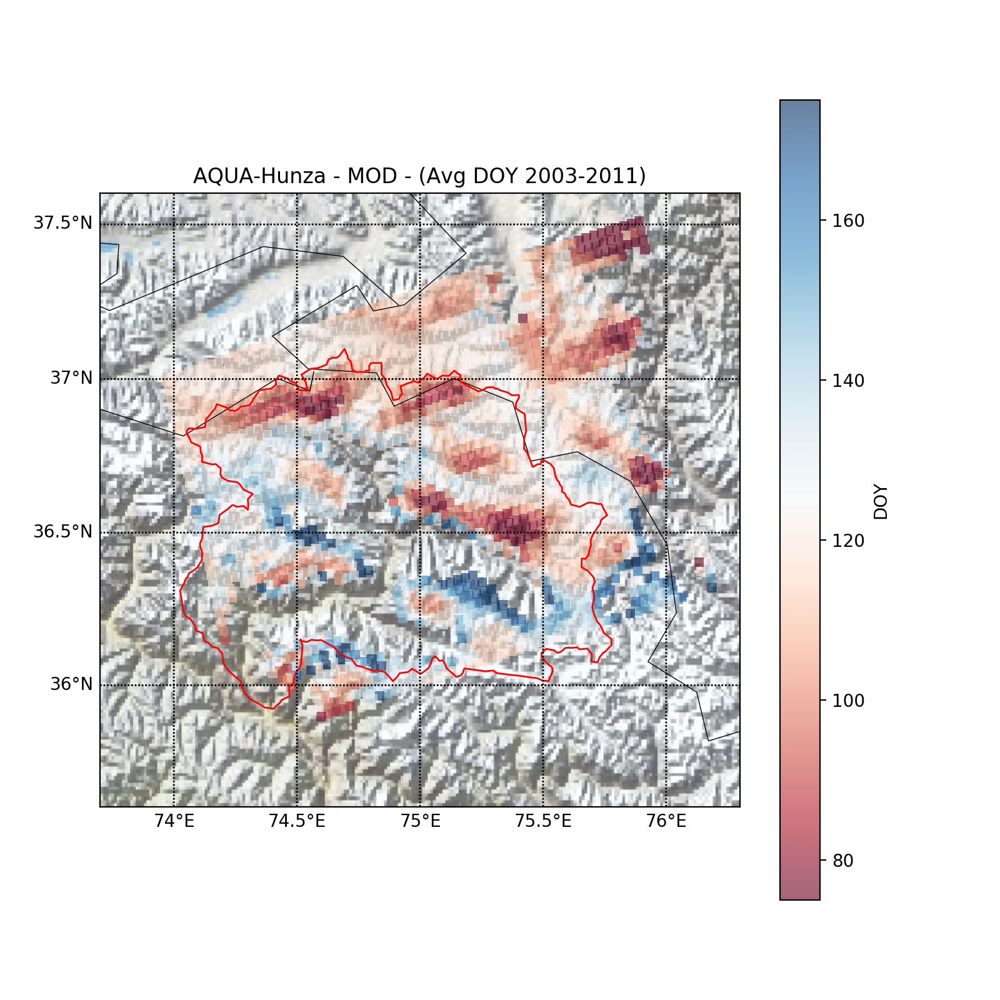

http://server.arcgisonline.com/ArcGIS/rest/services/World_Physical_Map/MapServer/export?bbox=8204246.471464263,4245720.660441586,8493677.147526773,4523072.31910875&bboxSR=3857&imageSR=3857&size=1500,1437&dpi=96&format=png32&transparent=true&f=image


<IPython.core.display.Javascript object>


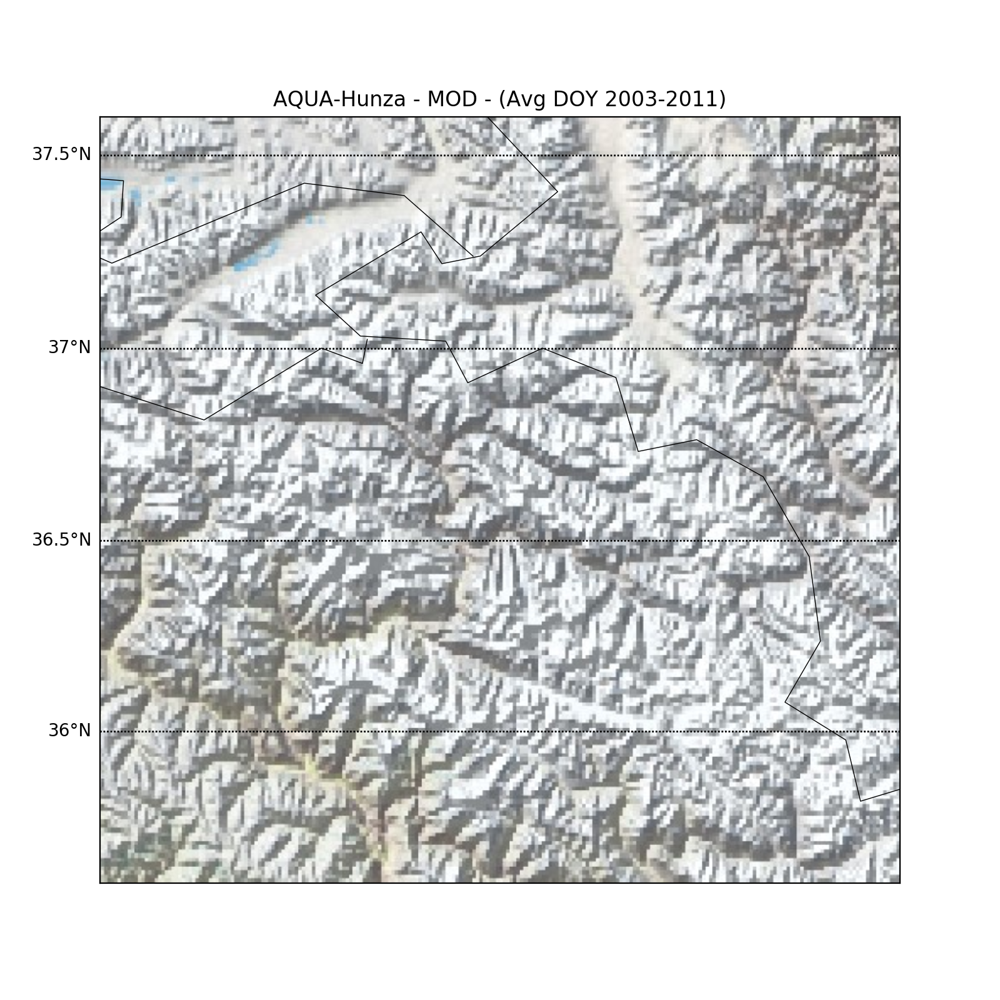

http://server.arcgisonline.com/ArcGIS/rest/services/World_Physical_Map/MapServer/export?bbox=8204246.471464263,4245720.660441586,8493677.147526773,4523072.31910875&bboxSR=3857&imageSR=3857&size=1500,1437&dpi=96&format=png32&transparent=true&f=image


In [94]:
# PLOT the MOD MAP - avg of all years or one year of interest - SIR

# Choose plot type - 'year' for one year of interest, 'all' for average of all years
#plot_type='year'  
plot_type='all'

#year=2003


if plot_type=='all':
    array=MOD_DOY_array
    title = "%s-%s - MOD - (Avg DOY %4d-%4d)" % (platform, Site, Years[0], Years[-1])
elif plot_type=='year':
    array=MOD_DOY_array_year
    title = "%s-%s - MOD - (%4d DOY)" % (platform, Site, year)

fig = plt.figure(figsize=(8,8))
# create figure and axes instances
#fig = plt.figure()
ax = fig.add_axes([0.1,0.1,0.8,0.8])
#ax = fig.add_subplot(121)
# create polar stereographic Basemap instance.
# Why polar stereo???
m = Basemap(projection='stere',lon_0=(lon_start+lon_end)/2,lat_0=(lat_start+lat_end)/2,lat_ts=90.,\
            llcrnrlat=(lat_start-.3),urcrnrlat=(lat_end+.5),\
            llcrnrlon=(lon_start-.3),urcrnrlon=(lon_end+.3),\
            rsphere=6371200.,resolution='l',area_thresh=10000, epsg=3857)
m.drawcoastlines()
m.drawcountries()
m.drawstates()
#m.etopo(scale=5, alpha=0.7)
#m.bluemarble(scale=1)
parallels = np.arange(0.,90,0.5)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
# draw meridians
meridians = np.arange(0,360.,0.5)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
m.arcgisimage(service='World_Physical_Map', xpixels = 1500, verbose= True)

m.readshapefile('/work/charis/ti_model/basins/basin_outlines/IN_Hunza_at_DainyorBridge', 'Hunza', color='red', linewidth=1)

x,y=m(pixel_lons, pixel_lats)
m.scatter(x,y,c=array, s=30, marker='s',lw=0,cmap='RdBu', alpha=.6)
plt.title(title)

plt.colorbar(label='DOY')
plt.clim(75,175)  #color bar limits

plt.show()


# plot another blank map with no pixel overlay
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1,0.1,0.8,0.8])

# create polar stereographic Basemap instance.
m = Basemap(projection='stere',lon_0=(lon_start+lon_end)/2,lat_0=(lat_start+lat_end)/2,lat_ts=90.,\
            llcrnrlat=(lat_start-.3),urcrnrlat=(lat_end+.5),\
            llcrnrlon=(lon_start-.3),urcrnrlon=(lon_end+.3),\
            rsphere=6371200.,resolution='l',area_thresh=10000, epsg=3857)
m.drawcoastlines()
m.drawcountries()
m.drawstates()
#m.etopo(scale=5, alpha=0.7)
#m.bluemarble(scale=1)
parallels = np.arange(0.,90,0.5)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
# draw meridians
meridians = np.arange(180.,360.,0.5)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
m.arcgisimage(service='World_Physical_Map', xpixels = 1500, verbose= True)


plt.title(title)
plt.show()


<IPython.core.display.Javascript object>


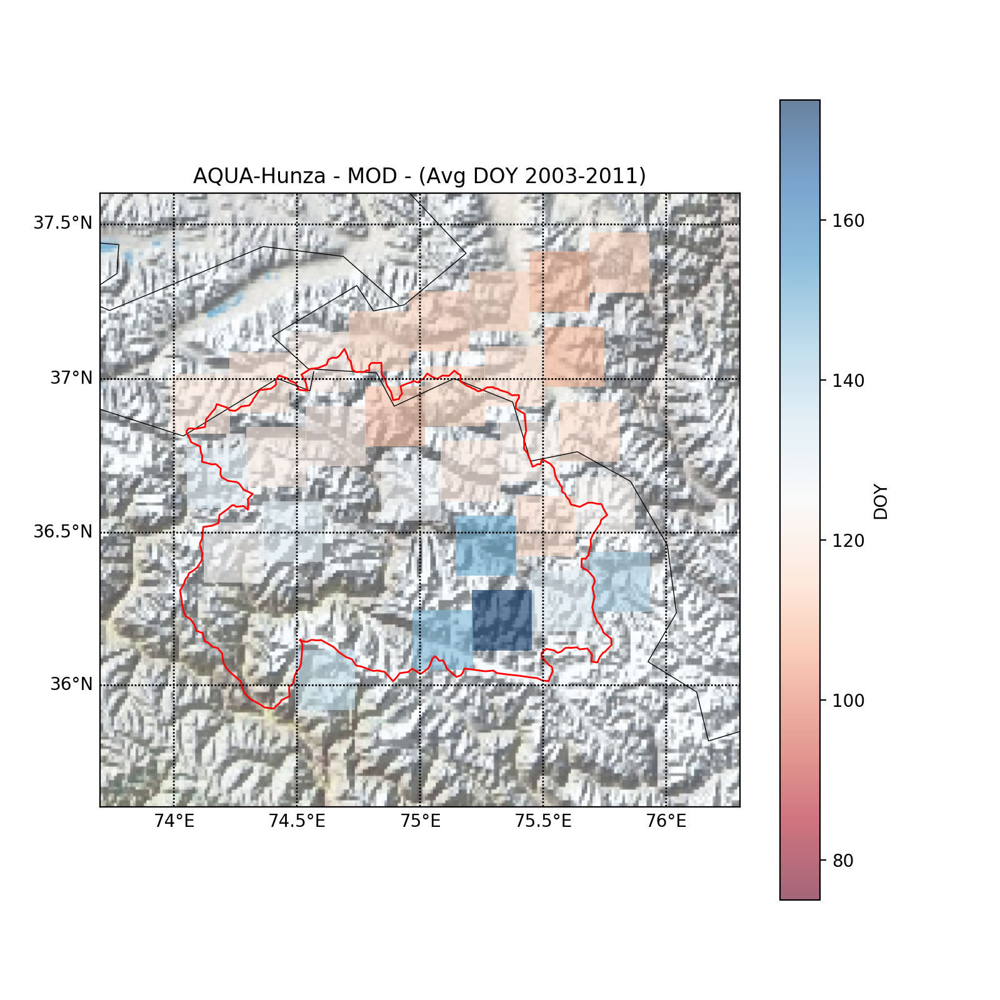

http://server.arcgisonline.com/ArcGIS/rest/services/World_Physical_Map/MapServer/export?bbox=8204246.471464263,4245720.660441586,8493677.147526773,4523072.31910875&bboxSR=3857&imageSR=3857&size=1500,1437&dpi=96&format=png32&transparent=true&f=image


<IPython.core.display.Javascript object>


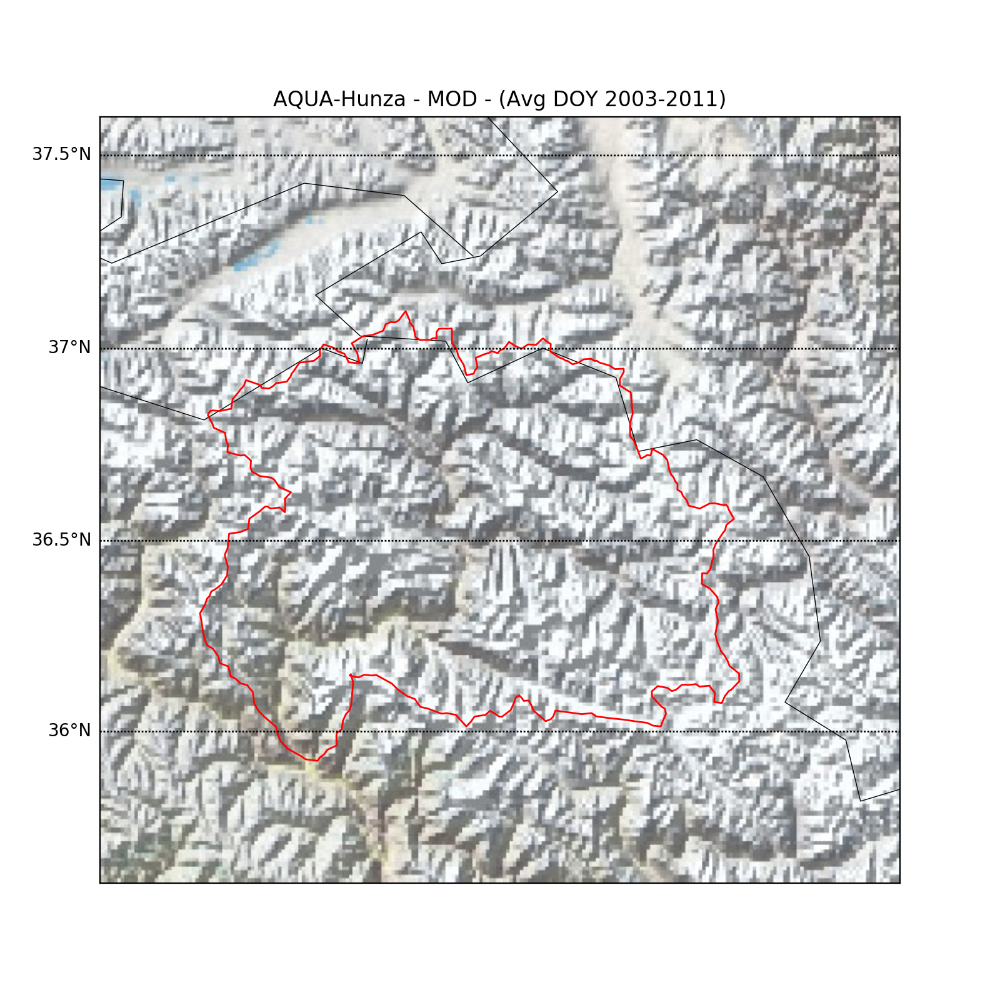

http://server.arcgisonline.com/ArcGIS/rest/services/World_Physical_Map/MapServer/export?bbox=8204246.471464263,4245720.660441586,8493677.147526773,4523072.31910875&bboxSR=3857&imageSR=3857&size=1500,1437&dpi=96&format=png32&transparent=true&f=image


In [95]:
# PLOT the MOD MAP - avg of all years or one year of interest - GRD
# Choose plot type - 'year' for one year of interest, 'all' for average of all years
#plot_type='year'  
plot_type='all'

#year=2003


if plot_type=='all':
    array=MOD_DOY_array_GRD
    title = "%s-%s - MOD - (Avg DOY %4d-%4d)" % (platform, Site, Years[0], Years[-1])
elif plot_type=='year':
    array=MOD_DOY_array_GRD_year
    title = "%s-%s - MOD - (%4d DOY)" % (platform, Site, year)

fig = plt.figure(figsize=(8,8))
# create figure and axes instances
#fig = plt.figure()
ax = fig.add_axes([0.1,0.1,0.8,0.8])
#ax = fig.add_subplot(121)
# create polar stereographic Basemap instance.
m = Basemap(projection='stere',lon_0=(lon_start+lon_end)/2,lat_0=(lat_start+lat_end)/2,lat_ts=90.,\
            llcrnrlat=(lat_start-.3),urcrnrlat=(lat_end+.5),\
            llcrnrlon=(lon_start-.3),urcrnrlon=(lon_end+.3),\
            rsphere=6371200.,resolution='l',area_thresh=10000, epsg=3857)
m.drawcoastlines()
m.drawcountries()
#m.drawstates()
#m.etopo(scale=3, alpha=0.7)
#m.bluemarble(scale=1)
parallels = np.arange(0.,90,0.5)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
# draw meridians
meridians = np.arange(0,360.,0.5)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
m.arcgisimage(service='World_Physical_Map', xpixels = 1500, verbose= True)

m.readshapefile('/work/charis/ti_model/basins/basin_outlines/IN_Hunza_at_DainyorBridge', 
                'Hunza', color='red', linewidth=1)

x,y=m(pixel_lons_GRD, pixel_lats_GRD)
m.scatter(x,y,c=array, s=1200, marker='s',lw=0,cmap='RdBu', alpha=.6)

plt.title(title)

plt.colorbar(label='DOY')
plt.clim(75,175)  #color bar limits

plt.show()


# plot another blank map with no pixel overlay
fig = plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1,0.1,0.8,0.8])

# create polar stereographic Basemap instance.
m = Basemap(projection='stere',lon_0=(lon_start+lon_end)/2,lat_0=(lat_start+lat_end)/2,lat_ts=90.,\
            llcrnrlat=(lat_start-.3),urcrnrlat=(lat_end+.5),\
            llcrnrlon=(lon_start-.3),urcrnrlon=(lon_end+.3),\
            rsphere=6371200.,resolution='l',area_thresh=10000, epsg=3857)
m.drawcoastlines()
m.drawcountries()
m.drawstates()
#m.etopo(scale=5, alpha=0.7)
#m.bluemarble(scale=1)
parallels = np.arange(0.,90,0.5)
m.drawparallels(parallels,labels=[1,0,0,0],fontsize=10)
# draw meridians
meridians = np.arange(180.,360.,0.5)
m.drawmeridians(meridians,labels=[0,0,0,1],fontsize=10)
m.arcgisimage(service='World_Physical_Map', xpixels = 1500, verbose= True)
m.readshapefile('/work/charis/ti_model/basins/basin_outlines/IN_Hunza_at_DainyorBridge', 
                'Hunza', color='red', linewidth=1)

plt.title(title)
plt.show()